# Interpret Binary Relevance Classifier （Foodtruck Dataset)

In [1]:
from IPython.display import display, HTML, Image

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import copy
import random

from sklearn.base import BaseEstimator, ClassifierMixin, clone
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from sklearn.metrics import make_scorer
from sklearn import metrics

# to avoid future warnings for sklearn
import warnings
warnings.filterwarnings("ignore")

## Import the dataset

In [2]:
# Read the CSV file
dataset = pd.read_csv('foodtruck.csv')
print("Dataset.shape: " + str(dataset.shape))

# split the features-X and class labels-y
X = dataset.iloc[:, :-12]
y = dataset.iloc[:, -12:]

print("X.shape: " + str(X.shape))
display(X.head())
print("y.shape: " + str(y.shape))
display(y.head())
print("Descriptive stats:")
X.describe()

Dataset.shape: (407, 33)
X.shape: (407, 21)


,frequency,time,expenses,motivation,taste,hygiene,menu,presentation,attendance,ingredients,...,takeaway,variation,stop.strucks,schedule,gender,age.group,scholarity,average.income,has.work,marital.status
0,2,1,30,1,5,4,4,3,4,4,...,3,3,2,2,1,2,1.5,4,0,1
1,0,1,20,2,5,2,4,4,4,4,...,2,3,1,4,0,3,2.0,5,1,0
2,1,2,15,2,5,2,2,5,3,5,...,2,2,2,1,1,2,1.5,4,1,1
3,0,3,40,1,5,5,4,3,4,4,...,4,5,1,1,1,3,2.0,6,1,1
4,0,1,15,4,5,4,2,3,4,4,...,3,4,1,1,1,2,1.5,4,1,1


y.shape: (407, 12)


,street_food,gourmet,italian_food,brazilian_food,mexican_food,chinese_food,japanese_food,arabic_food,snacks,healthy_food,fitness_food,sweets_desserts
0,1,0,0,0,0,0,0,0,0,0,0,1
1,1,0,1,0,1,0,0,0,0,0,0,1
2,1,0,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0


Descriptive stats:


,frequency,time,expenses,motivation,taste,hygiene,menu,presentation,attendance,ingredients,...,takeaway,variation,stop.strucks,schedule,gender,age.group,scholarity,average.income,has.work,marital.status
count,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,...,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000,407.000000
mean,0.761671,1.918919,21.486486,2.469287,4.771499,4.651106,3.773956,4.272727,4.535627,4.481572,...,2.732187,3.420147,2.690418,2.663391,0.481572,2.358722,1.640049,2.958231,0.511057,0.867322
std,0.987461,1.423176,7.247503,1.314345,0.595032,0.699150,1.097696,0.877647,0.724711,0.799649,...,0.982367,1.070374,1.283653,1.356325,0.500275,1.412145,0.907029,1.569640,0.500493,0.367509
min,0.000000,1.000000,15.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000
25%,0.000000,1.000000,15.000000,1.000000,5.000000,4.000000,3.000000,4.000000,4.000000,4.000000,...,2.000000,3.000000,2.000000,1.000000,0.000000,2.000000,1.000000,2.000000,0.000000,1.000000
50%,0.000000,1.000000,20.000000,2.000000,5.000000,5.000000,4.000000,4.000000,5.000000,5.000000,...,3.000000,4.000000,3.000000,3.000000,0.000000,2.000000,1.500000,3.000000,1.000000,1.000000
75%,1.000000,2.000000,20.000000,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,3.000000,4.000000,4.000000,4.000000,1.000000,3.000000,2.000000,4.000000,1.000000,1.000000
max,4.000000,5.000000,50.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,1.000000,8.000000,5.000000,6.000000,1.000000,2.000000


## Split the dataset into train and test

In [3]:
# Normalise the data
X = (X-X.min())/(X.max()-X.min())

# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, train_size=0.7)

print("X_train.shape: " + str(X_train.shape))
print("X_test.shape: " + str(X_test.shape))
print("y_train.shape: " + str(y_train.shape))
print("y_test.shape: " + str(y_test.shape))

X_train.shape: (284, 21)
X_test.shape: (123, 21)
y_train.shape: (284, 12)
y_test.shape: (123, 12)


## Define the Binary Relevance Classifier

In [4]:
class BinaryRelevanceClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, base_classifier=LogisticRegression()):
        self.base_classifier=base_classifier

    def fit(self, X, y):
        """Build a Binary Relevance classifier from the training set (X, y).
        Parameters
        ----------
        X : array-like or sparse matrix, shape = [n_samples, n_features]
            The training input samples. Internally, it will be converted to
            ``dtype=np.float32`` and if a sparse matrix is provided
            to a sparse ``csc_matrix``.
        y : array-like, shape = [n_samples, n_labels] 
            The target values (class labels) as integers or strings.
        """

        # list of individual classifiers
        self.models = []
       
        # for every class label
        for label in list(y.columns):
            # Check that X and y have correct shape
            x_checked, y_checked = check_X_y(X, y[label])
            # every classifier is independent of the others
            # hence we create a copy of the base classifier instance
            base_model = clone(self.base_classifier)
            # fit the base model - one model each for Y1, Y2....Y14
            basel_model = base_model.fit(x_checked, y_checked)
            # add the fitted model list of individual classifiers
            self.models.append(base_model)

    # The predict function to make a set of predictions for a set of query instances
    def predict(self, X):
        # check if the models list has been set up
        check_is_fitted(self, ['models'])
        X = check_array(X)
        
        all_preds = pd.DataFrame()
        i=0
        # list of individual classifier predictions
        preds = []
        
        # predict against each fitted model - one model per label
        for model in self.models:
            pred = model.predict(X)
            # add the prediction to the dataframe
            preds.append(pd.DataFrame({'Class'+ str(i+1): pred}))
            i+=1
        
        # dataframe with predictions for all class labels
        all_preds = pd.concat(preds, axis=1)
        # standard sklearn classifiers return predictions as numpy arrays
        # hence convert the dataframe to a numpy array
        return all_preds.to_numpy()
    


    def predict_proba(self,X):
        # check if the models list has been set up
        check_is_fitted(self, ['models'])
        X = check_array(X)
        
        all_preds = pd.DataFrame()
        i = 0
        
        for model in self.models:
            # Call predict_proba of the each base model
            pred = model.predict_proba(X)
            # Add the probabilities of 1 to the dataframe
            all_preds['Class'+str(i+1)] = [one_prob[1] for one_prob in pred]
            i+=1
        
        #return probabilities
        return all_preds.to_numpy()

## Put the data into our classifier(LogisticRegression() as initiated classifier)

In [5]:
# instantiate the classifier
br_clf = BinaryRelevanceClassifier(LogisticRegression())
# fit
br_clf.fit(X_train, y_train)
# predict
y_pred = br_clf.predict(X_test)
print("y_pred.shape: " + str(y_pred.shape))

y_pred.shape: (123, 12)


## Define accuracy_score function

In [6]:
def accuracy_score(y_test, y_pred):
    # y_pred is a numpy array, y_test is a dataframe
    # to compare the two, convert to a single type
    y_test = y_test.to_numpy()
    
    # shape of test and preds must be equal
    assert y_test.shape == y_pred.shape
    i=0
    # list of scores for each training sample
    scores = []
    
    # for each test sample
    while i < len(y_test):
        count=0
        # count the number of matches in the sample
        # y_test[i] -> row values in test set (true values)
        # y_pred[i] -> row values in predictions set (predicted values)
        for p, q in zip(y_test[i], y_pred[i]):
            if p == q:
                count += 1

        # accuracy score for the sample = no. of correctly predicted labels/total no. of labels
        scores.append(count / y_pred.shape[1])
        i+=1 

    # final accuracy = avg. accuracy over all test samples =
    # sum of the accuracy of all training samples/no. of training samples
    return round((sum(scores)/len(y_test)), 5)

In [7]:
print("Accuracy of Binary Relevance Classifier: " + str(accuracy_score(y_test, y_pred)))

Accuracy of Binary Relevance Classifier: 0.8645


## Use grid search to get the classifier with higher accuracy

In [8]:
cv_folds=5

# Set up the parameter grid to search
param_grid ={'base_classifier': [DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_leaf=2),
                                 RandomForestClassifier(criterion='entropy'),
                                 LogisticRegression(max_iter=20000), GaussianNB(), KNeighborsClassifier(), SVC()] }

# Perform the search
# Using the custom accuracy function defined earlier
tuned_model = GridSearchCV(BinaryRelevanceClassifier(), \
                            param_grid, scoring=make_scorer(accuracy_score), verbose = 2, n_jobs = -1, cv=cv_folds)
tuned_model.fit(X_train, y_train)

# Print details of the best model
print("Best Parameters Found: ")
display(tuned_model.best_params_)
display(tuned_model.best_score_)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    6.5s finished


Best Parameters Found: 


{'base_classifier': RandomForestClassifier(criterion='entropy')}

0.845462

In [9]:
# instantiate the classifier
br_clf = BinaryRelevanceClassifier(RandomForestClassifier(criterion='entropy'))
# fit
br_clf.fit(X_train, y_train)
# predict
y_pred = br_clf.predict(X_test)
print("y_pred.shape: " + str(y_pred.shape))

y_pred.shape: (123, 12)


In [10]:
print("Accuracy of Binary Relevance Classifier - Best Model: " + str(accuracy_score(y_test, y_pred)))

Accuracy of Binary Relevance Classifier - Best Model: 0.87398


## Let's see the type of output of predict and predict_proba function

In [11]:
print(type(y_pred))

<class 'numpy.ndarray'>


In [12]:
#Get values of prediction
pd.options.display.max_rows = 50
y_pred_df=pd.DataFrame(y_pred, columns=y.columns.tolist())
y_pred_df

,street_food,gourmet,italian_food,brazilian_food,mexican_food,chinese_food,japanese_food,arabic_food,snacks,healthy_food,fitness_food,sweets_desserts
0,1,1,0,0,0,0,0,0,0,0,0,1
1,1,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,1
3,1,0,0,0,0,0,0,0,1,0,0,1
4,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
118,1,1,0,0,0,0,0,0,0,0,0,1
119,1,0,0,0,0,0,0,0,0,0,0,0
120,0,0,0,0,0,0,0,0,0,0,0,0
121,1,0,0,0,0,0,0,0,0,0,0,1


In [13]:
y_pred_proba = br_clf.predict_proba(X_test)
print(type(y_pred))

<class 'numpy.ndarray'>


In [14]:
##Get values of predict_proba function
y_pred_proba_df=pd.DataFrame(y_pred_proba, columns=y.columns.tolist())
y_pred_proba_df

,street_food,gourmet,italian_food,brazilian_food,mexican_food,chinese_food,japanese_food,arabic_food,snacks,healthy_food,fitness_food,sweets_desserts
0,0.84,0.60,0.04,0.07,0.14,0.01,0.08,0.05,0.00,0.08,0.00,0.74
1,0.73,0.30,0.15,0.26,0.34,0.17,0.26,0.20,0.14,0.20,0.03,0.42
2,0.73,0.35,0.14,0.13,0.15,0.01,0.10,0.09,0.31,0.10,0.13,0.61
3,0.88,0.16,0.12,0.25,0.12,0.08,0.07,0.05,0.52,0.08,0.02,0.58
4,0.66,0.07,0.05,0.20,0.17,0.09,0.12,0.08,0.24,0.06,0.07,0.29
...,...,...,...,...,...,...,...,...,...,...,...,...
118,0.59,0.75,0.13,0.04,0.12,0.01,0.06,0.08,0.01,0.03,0.00,0.53
119,0.80,0.20,0.17,0.19,0.13,0.01,0.03,0.04,0.32,0.06,0.04,0.48
120,0.46,0.37,0.01,0.11,0.07,0.08,0.15,0.04,0.03,0.18,0.18,0.34
121,0.75,0.39,0.19,0.04,0.05,0.02,0.13,0.02,0.26,0.04,0.04,0.56


## Interpret this classifier with SHAP

### Import SHAP

In [15]:
import shap
import time
shap.initjs()

## Explain the predict_proba function of this classifier.

In [16]:
#First, build the explainer.
explainer_BR = shap.KernelExplainer(br_clf.predict_proba,X_train)

Using 284 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


## Local Interpretability of predict_proba function

### Calculate SHAP values of Sample 1

In [17]:
shap_values = explainer_BR.shap_values(X_test.iloc[0,:])

#### Explanation of Sample 1 for the first label "street_food"

In [18]:
shap.force_plot(explainer_BR.expected_value[0], shap_values[0], X_test.iloc[0,:])

#### Explanation of Sample 1 for the second label "gourmet"

In [19]:
shap.force_plot(explainer_BR.expected_value[1], shap_values[1], X_test.iloc[0,:])

#### Explanation of Sample 1 for the third label "italian_food"

In [20]:
shap.force_plot(explainer_BR.expected_value[2], shap_values[2], X_test.iloc[0,:])

### Calculate SHAP values of Sample 2

In [21]:
shap_values = explainer_BR.shap_values(X_test.iloc[1,:])

#### Explanation of Sample 2 for the first label "street_food"

In [22]:
shap.force_plot(explainer_BR.expected_value[0], shap_values[0], X_test.iloc[1,:])

#### Explanation of Sample 2 for the second label "gourmet"

In [23]:
shap.force_plot(explainer_BR.expected_value[1], shap_values[1], X_test.iloc[1,:])

#### Explanation of Sample 2 for the third label "italian_food"

In [24]:
shap.force_plot(explainer_BR.expected_value[2], shap_values[2], X_test.iloc[1,:])

#### Explanation of any Sample (location is X_test.iloc[x,:]) for Label n

In [25]:
#shap_values = explainer_BR.shap_values(X_test.iloc[n-1,:])
#shap.force_plot(explainer_BR.expected_value[n-1], shap_values[n-1], X_test.iloc[x,:])

## Global Interpretability of predict_proba function

### To get the integral outlook of all samples, we use the K-Means Algorithm to summarize the data otherwise it wil take too much time (a few hours)to complete all the calculation. But on the other hand we will lose some accuracy.

In [26]:
# using kmeans
X_train_summary = shap.kmeans(X_train, 10)
explainer_BR = shap.KernelExplainer(br_clf.predict_proba, X_train_summary)
shap_values_KNN_test = explainer_BR.shap_values(X_test)

### Summerize the explanations of predictions about Label "street_food"

In [27]:
shap.force_plot(explainer_BR.expected_value[0], shap_values_KNN_test[0], X_test)

### Summerize the explanations of predictions about label "gourmet"

In [28]:
shap.force_plot(explainer_BR.expected_value[1], shap_values_KNN_test[1], X_test)

### Summerize the explanations of predictions about label "italian_food"

In [29]:
shap.force_plot(explainer_BR.expected_value[2], shap_values_KNN_test[2], X_test)

### Summerize the explanations of predictions about label "chinese_food"

In [30]:
shap.force_plot(explainer_BR.expected_value[5], shap_values_KNN_test[5], X_test)

### Summerize the explanations of predictions about the n-th Label

In [31]:
#shap.force_plot(explainer_BR.expected_value[n-1], shap_values_KNN_test[n-1], X_test)

## Bar chart of feature Importance

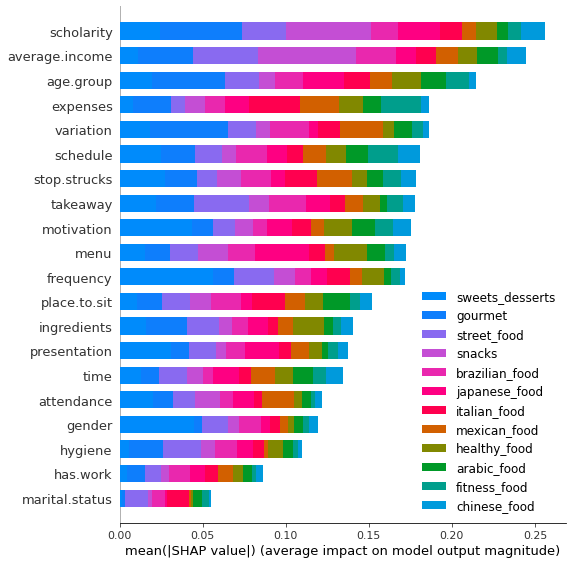

In [32]:
shap.summary_plot(shap_values_KNN_test, X, plot_type="bar",class_names = y.columns.tolist())

### Summarize the impact of all features over the entire dataset

From the bar chart we can know how the predictions of labels are most influenced by the specific features. For example, the feature "scholarity" has the most influences on the prediction about labels "gourmet" and "snacks". The feature"average.income" has the most influences on the prediction about label "street_food".

### summary_plot shows how each feature impacts the labels 

#### How each feature impacts Label "gourmet".

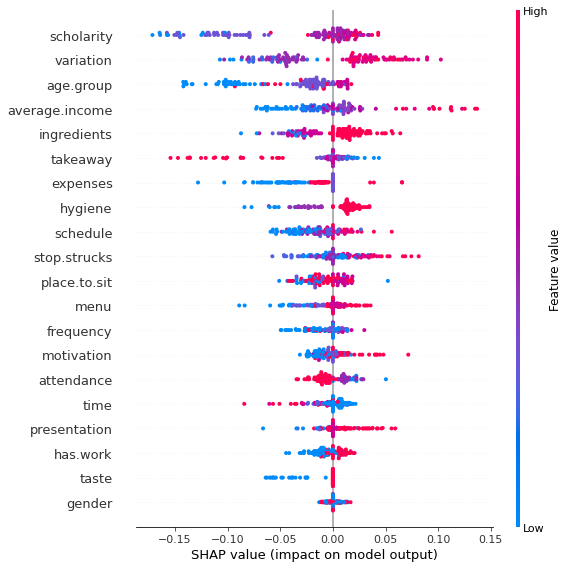

In [33]:
shap.summary_plot(shap_values_KNN_test[1], X_test)

#### How each feature impacts label "snacks".

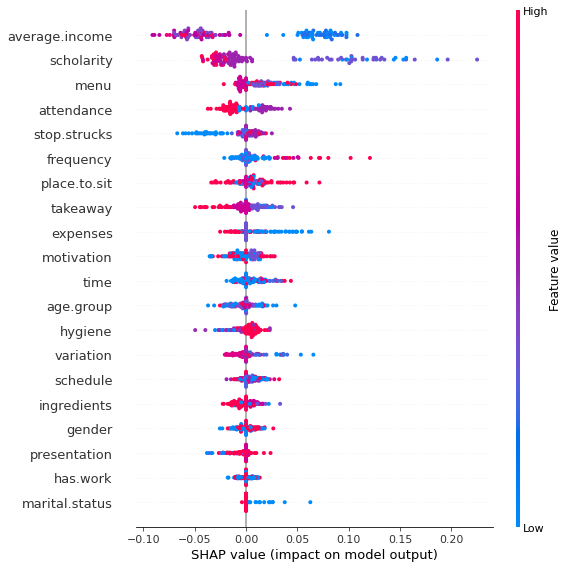

In [34]:
shap.summary_plot(shap_values_KNN_test[8], X_test)

#### How each feature impacts label "street_food".

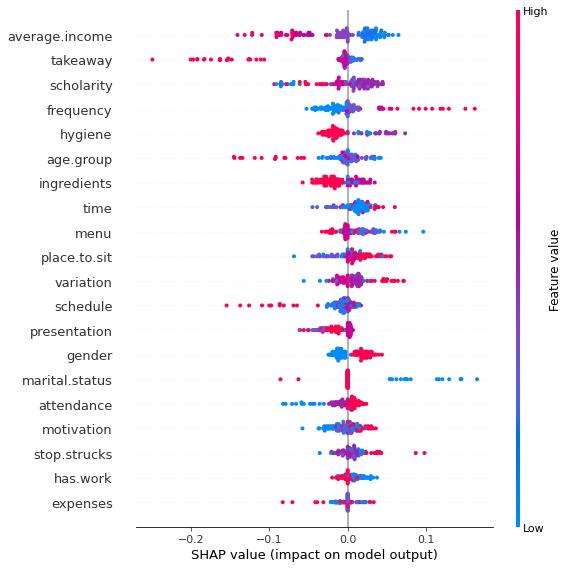

In [35]:
shap.summary_plot(shap_values_KNN_test[0], X_test)

### We use dependence_plot to examine how changes in a feature change the model's prediction.

### Feature "scholarity" on Label "snacks"

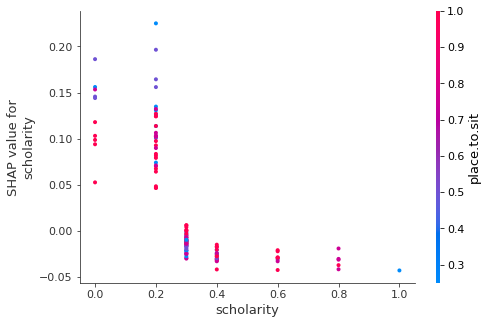

In [36]:
shap.dependence_plot("scholarity", shap_values_KNN_test[8], X_test)

### Feature "scholarity" on Label "gourmet"

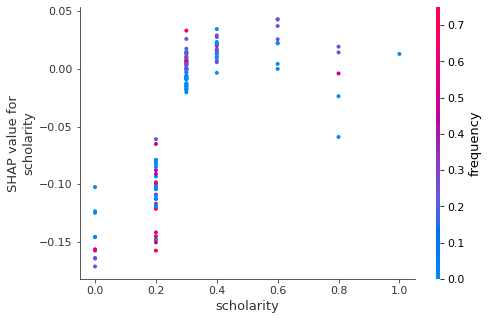

In [37]:
shap.dependence_plot("scholarity", shap_values_KNN_test[1], X_test)

### Feature "average.income" on Label "street_food"

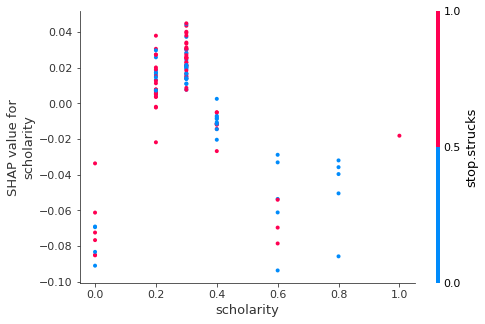

In [38]:
shap.dependence_plot("scholarity", shap_values_KNN_test[0], X_test)

## Explain the predict function

### SHAP can also explain the predict function of this classifier. All the processes are the same as above(namely explanation of predict_proba function).

In [39]:
#First, build the explainer.
explainer_BR2 = shap.KernelExplainer(br_clf.predict,X_train)

Using 284 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


## Local Interpretability of predict function

### Calculate SHAP value of sample 1

In [40]:
shap_values2 = explainer_BR2.shap_values(X_test.iloc[0,:])

#### Explanation of Sample 1 for label "street_food"

In [41]:
shap.force_plot(explainer_BR2.expected_value[0], shap_values2[0], X_test.iloc[0,:])

#### Explanation of Sample 1 for label "gourmet"

In [42]:
shap.force_plot(explainer_BR2.expected_value[1], shap_values2[1], X_test.iloc[0,:])

#### Explanation of Sample 1 for label "sweets_desserts"

In [43]:
shap.force_plot(explainer_BR2.expected_value[11], shap_values2[11], X_test.iloc[0,:])

### Calculate SHAP value of sample 2

In [44]:
shap_values2 = explainer_BR2.shap_values(X_test.iloc[1,:])

#### Explanation of Sample 2 for label "street_food"

In [45]:
shap.force_plot(explainer_BR2.expected_value[0], shap_values2[0], X_test.iloc[1,:])

#### Explanation of Sample 2 for label "gourmet"

In [46]:
shap.force_plot(explainer_BR2.expected_value[1], shap_values2[1], X_test.iloc[1,:])

#### Explanation of Sample 2 for label "sweets_desserts"

In [47]:
shap.force_plot(explainer_BR2.expected_value[11], shap_values2[11], X_test.iloc[1,:])

## Global Interpretability of predict function

### Use the K-Means Algorithm to summarize the data

In [48]:
# using kmeans
X_train_summary2 = shap.kmeans(X_train, 10)
explainer_BR2 = shap.KernelExplainer(br_clf.predict, X_train_summary2)
shap_values_KNN_test2 = explainer_BR2.shap_values(X_test)

### Summerize the explanations of predictions about label "street_food"

In [49]:
shap.force_plot(explainer_BR2.expected_value[0], shap_values_KNN_test2[0], X_test)

### Summerize the explanations of predictions about label "gourmet"

In [50]:
shap.force_plot(explainer_BR2.expected_value[1], shap_values_KNN_test2[1], X_test)

### Summerize the explanations of predictions about label "healthy_food"

In [57]:
shap.force_plot(explainer_BR2.expected_value[9], shap_values_KNN_test2[9], X_test)

### Summerize the explanations of predictions about label "sweets_desserts"

In [54]:
shap.force_plot(explainer_BR2.expected_value[11], shap_values_KNN_test2[11], X_test)

## Bar chart of mean(|SHAP value|)

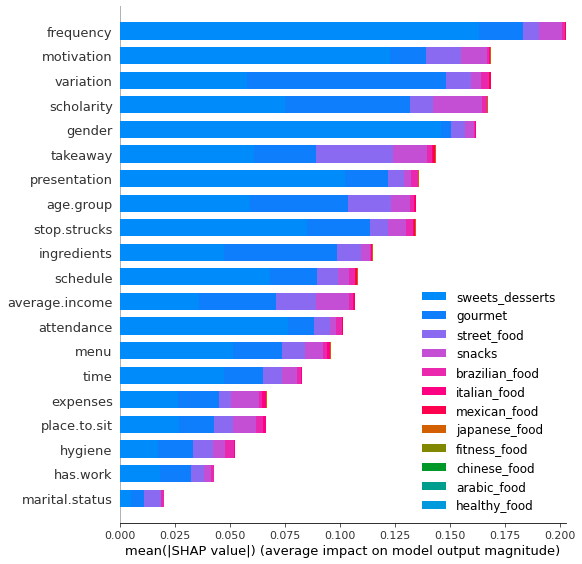

In [55]:
shap.summary_plot(shap_values_KNN_test2, X, plot_type="bar",class_names = y.columns.tolist())

It seems that the performance of explainer_BR2 is not so good...It lose the SHAP values of many labels ,such as japanese_food, fitness_food, chinese_food, arabic_food and healthy_food. So we don't discuss too much about this explainer.

## Explain with LIME

### Import LIME

In [58]:
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)

### Explaination about predict_proba function

In [61]:
# Creating the Lime Explainer
# Be very careful in setting the order of the class names
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="lasso_path",
    class_names=["street_food","gourmet","italian_food","brazilian_food","mexican_food","chinese_food","japanese_food","arabic_food","snacks","healthy_food","fitness_food","sweets_desserts"],
    discretize_continuous=True,
    discretizer="entropy",
)

In [64]:
#Now let's pick a sample case from our test set.
row = 1
exp = lime_explainer.explain_instance(X_test.iloc[row], br_clf.predict_proba, num_features=21)
exp.show_in_notebook(show_table=True)

In [65]:
#Now let's pick a sample case from our test set.
row = 3
exp = lime_explainer.explain_instance(X_test.iloc[row], br_clf.predict_proba, num_features=21)
exp.show_in_notebook(show_table=True)

In [66]:
#Now let's pick a sample case from our test set.
row = 5
exp = lime_explainer.explain_instance(X_test.iloc[row], br_clf.predict_proba, num_features=21)
exp.show_in_notebook(show_table=True)

### Explaination about predict function

In [67]:
# Creating the Lime Explainer
# Be very careful in setting the order of the class names
lime_explainer2 = lime.lime_tabular.LimeTabularExplainer(
    X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="lasso_path",
    class_names=["street_food","gourmet","italian_food","brazilian_food","mexican_food","chinese_food","japanese_food","arabic_food","snacks","healthy_food","fitness_food","sweets_desserts"],
    discretize_continuous=True,
    discretizer="entropy",
)

In [71]:
#Now let's pick a sample case from our test set.
row = 1
exp = lime_explainer2.explain_instance(X_test.iloc[row], br_clf.predict, num_features=21)
exp.show_in_notebook(show_table=True)

In [72]:
#Now let's pick a sample case from our test set.
row = 3
exp = lime_explainer2.explain_instance(X_test.iloc[row], br_clf.predict, num_features=21)
exp.show_in_notebook(show_table=True)

In [73]:
#Now let's pick a sample case from our test set.
row = 5
exp = lime_explainer2.explain_instance(X_test.iloc[row], br_clf.predict, num_features=21)
exp.show_in_notebook(show_table=True)

## Explain with eli5(Permutation Feature Importance)

### Import eli5

In [74]:
import eli5
from eli5.sklearn import PermutationImportance

In [75]:
perms_BR = PermutationImportance(br_clf).fit(X_test, y_test)

In [76]:
eli5.show_weights(perms_BR,top=21,feature_names = X.columns.tolist())

Weight,Feature
0.0374 ± 0.0302,frequency
0.0211 ± 0.0221,motivation
0.0130 ± 0.0195,has.work
0.0114 ± 0.0302,expenses
0.0114 ± 0.0130,schedule
0.0114 ± 0.0166,marital.status
0.0081 ± 0.0145,age.group
0.0065 ± 0.0260,attendance
0.0065 ± 0.0159,ingredients
0.0065 ± 0.0159,menu
